In [1]:
from sklearn import datasets
iris = datasets.load_iris()

In [2]:
iris.data[:5]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [3]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [4]:
iris.target[:5]

array([0, 0, 0, 0, 0])

In [5]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(context='talk')

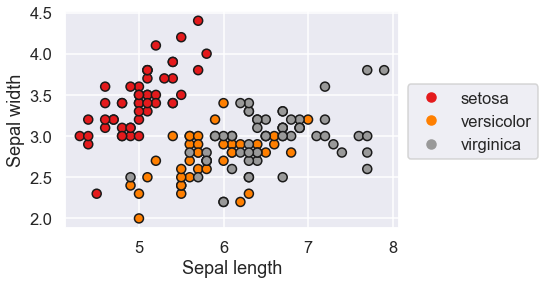

In [7]:
scatter = plt.scatter(x=iris.data[:,0], y=iris.data[:,1], c=iris.target,
    cmap=plt.cm.Set1, edgecolor='k')

plt.xlabel('Sepal length')
plt.ylabel('Sepal width')
plt.legend(handles=scatter.legend_elements()[0], labels=list(iris.target_names),
    bbox_to_anchor=(1, 0.7))

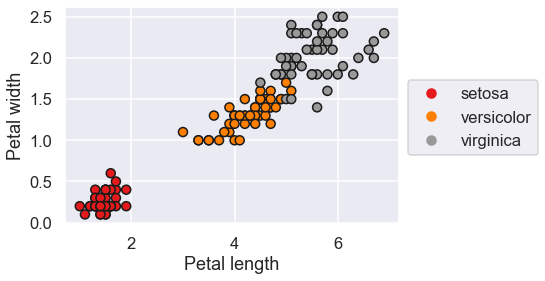

In [8]:
scatter = plt.scatter(x=iris.data[:,2], y=iris.data[:,3], c=iris.target, 
    cmap=plt.cm.Set1, edgecolor='k')

plt.xlabel('Petal length')
plt.ylabel('Petal width')
plt.legend(handles=scatter.legend_elements()[0], labels=list(iris.target_names),
    bbox_to_anchor=(1, 0.7))

In [9]:
from sklearn.model_selection import train_test_split
from sklearn import neighbors

X = iris.data
y = iris.target
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3)

n_neighbors = 5
clf = neighbors.KNeighborsClassifier(n_neighbors)
clf.fit(X_train, y_train)

KNeighborsClassifier()

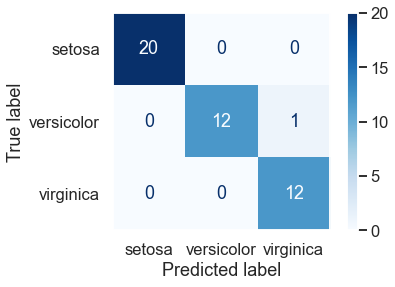

In [10]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf, X_test, y_test,
    display_labels=iris.target_names, cmap=plt.cm.Blues)
plt.grid(False)

In [11]:
# Using only 2 features
X = iris.data[:,:2]
y = iris.target

n_neighbors = 5
clf = neighbors.KNeighborsClassifier(n_neighbors)
clf.fit(X, y)

KNeighborsClassifier()

In [12]:
from matplotlib.colors import ListedColormap

# Create color maps
cmap_light = ListedColormap(['#ed5e5f', '#ffa54d', '#bfbfbf'])
cmap_bold = ListedColormap(['#e41a1c', '#ff7f00', '#999999'])

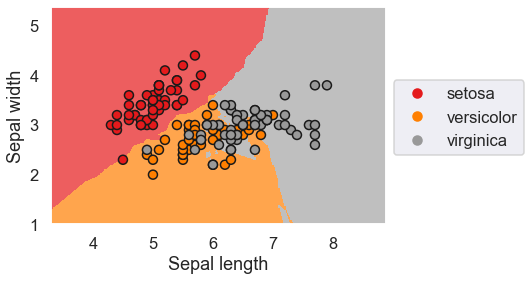

In [13]:
import numpy as np

# Create a mesh
h = 0.02  # step size
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
    np.arange(y_min, y_max, h))

Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

# Plot the decision boundary
Z = Z.reshape(xx.shape)
plt.figure()
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, edgecolor='k')
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())

plt.xlabel('Sepal length')
plt.ylabel('Sepal width')
plt.legend(handles=scatter.legend_elements()[0], labels=list(iris.target_names),
    bbox_to_anchor=(1, 0.7))